In [1]:
import sys
from pathlib import Path

# Add parent directory to sys.path
parent_dir = Path.cwd().parent
if str(parent_dir) not in sys.path:
    sys.path.insert(0, str(parent_dir))

In [2]:
import lightning as L
import torch
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

In [3]:
from causalflows.scms import SCM, CausalEquations
from decaflow.utils.example_equations import SachsEquations, EmpiricalGaussianBase

In [4]:
epochs = 1000

In [5]:
from cdt.data import load_dataset
data_sachs, _ = load_dataset("sachs")
eq = SachsEquations(equations_type = 'additive')
graph = eq.graph
node_order = eq.node_order
base_dist = EmpiricalGaussianBase(graph, node_order, data_sachs)
u_samples = base_dist.sample((128,))
# scm =  SCM(equations=eq, base=base_dist)
scm = SCM(equations=eq, base='std-gaussian')

Detecting 1 CUDA device(s).


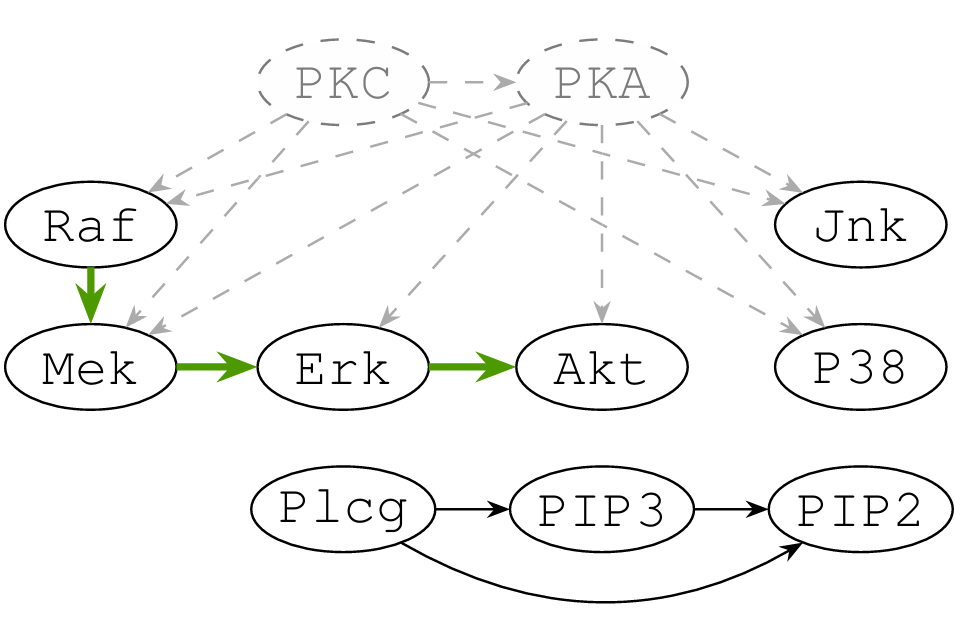

In [6]:
# insert ../assets/napkin_graph.png
from IPython.display import Image, display

display(Image(filename='../assets/sachs_graph.png'))

In [7]:
def generate_data(size: int):
    return scm.sample((size,))
def generate_int_data(size: int, index, value):
    return scm.sample_interventional(index, value, (size,))
columns = node_order

In [8]:
x = scm.sample((1,))

In [9]:
adjacency = scm.adjacency

In [10]:
from torch.utils.data import DataLoader, TensorDataset

In [11]:
num_hidden = 2
batch_size = 4096

train_size = 25000
train_data = generate_data(train_size)

test_size = int(train_size * 0.1)
test_data = generate_data(test_size)

# Standardize the data
mu, sigma = train_data.mean(dim=0), train_data.std(dim=0)
train_data = (train_data - mu) / sigma
test_data = (test_data - mu) / sigma

z_train, x_train = train_data[:, :num_hidden], train_data[:, num_hidden:]
z_test, x_test = test_data[:, :num_hidden], test_data[:, num_hidden:]

n_features = x_train.shape[1]

# Create the dataloaders
train_dataset = TensorDataset(x_train)
train_loader = DataLoader(train_dataset, batch_size, shuffle=True)

all_train_loader = DataLoader(TensorDataset(train_data), batch_size, shuffle=True)

test_dataset = TensorDataset(x_test)
test_loader = DataLoader(test_dataset, batch_size=test_size)
all_test_loader = DataLoader(TensorDataset(test_data), batch_size)

In [12]:
from decaflow.models import Encoder, Decoder, DeCaFlow
from decaflow.utils.logger import MyLogger
encoder = Encoder(flow_type='nsf', num_hidden=num_hidden, adjacency=adjacency,
                  features=num_hidden, context=n_features, hidden_features=[64, 64],
                  activation=torch.nn.ReLU)
decoder = Decoder(flow_type='nsf', num_hidden=num_hidden, adjacency=adjacency,
                  features=n_features, context=num_hidden, hidden_features=[64, 64, 64],
                  activation=torch.nn.ReLU)
unaware_decoder = Decoder(flow_type='nsf', num_hidden=0, adjacency=adjacency[num_hidden:, num_hidden:],
                    features=n_features, context=0, hidden_features=[64, 64, 64],
                    activation=torch.nn.ReLU)
oracle_decoder =  Decoder(flow_type='nsf', num_hidden=0, adjacency=adjacency,
                    features=n_features+num_hidden, context=0, hidden_features=[64, 64, 64],
                    activation=torch.nn.ReLU)
scheduler_cls = torch.optim.lr_scheduler.ReduceLROnPlateau
scheduler_config = {'mode': 'min', 'factor': 0.95, 'patience': 10, 'verbose': True, 'cooldown':0}

decaflow = DeCaFlow(encoder=encoder, flow=decoder,
                    regularize=True, warmup=100,
                    lr=1e-3, optimizer_cls=torch.optim.Adam,
                    scheduler_cls=scheduler_cls,
                    scheduler_kwargs=scheduler_config,
                    scheduler_monitor='train_loss')
unaware_flow = DeCaFlow(encoder=None, flow=unaware_decoder, regularize=False,
                    lr=1e-3, optimizer_cls=torch.optim.Adam,
                    scheduler_cls=scheduler_cls,
                    scheduler_kwargs=scheduler_config,
                    scheduler_monitor='train_loss')
oracle = DeCaFlow(encoder=None, flow=oracle_decoder, regularize=False,
                  lr=1e-3, optimizer_cls=torch.optim.Adam,
                    scheduler_cls=scheduler_cls,
                    scheduler_kwargs=scheduler_config,
                    scheduler_monitor='train_loss')

In [13]:
logger = MyLogger()
trainer = L.Trainer(max_epochs=epochs, logger=logger, enable_checkpointing=False, log_every_n_steps=len(train_loader)-1)
trainer.fit(decaflow, train_loader)

GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
You defined a `validation_step` but have no `val_dataloader`. Skipping val loop.
The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
The lr scheduler dict contains the key(s) ['monitor', 'strict'], but the keys will be ignored. You need to call `lr_scheduler.step()` manually in manual optimization.

  | Name    | Type    | Params | Mode 
--------------------------------------------
0 | encoder | Encoder | 7.9 K  | train
1 | flow    | Decoder | 22.5 K | train
--------------------------------------------
30.5 K    Trainable params
0         Non-trainable params
30.5 K    Total params
0.122     Total estimated model params size (MB)
20        Modules in train mode
0         Modules in eval mode
The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_wor

Training: |          | 0/? [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_epochs=1000` reached.


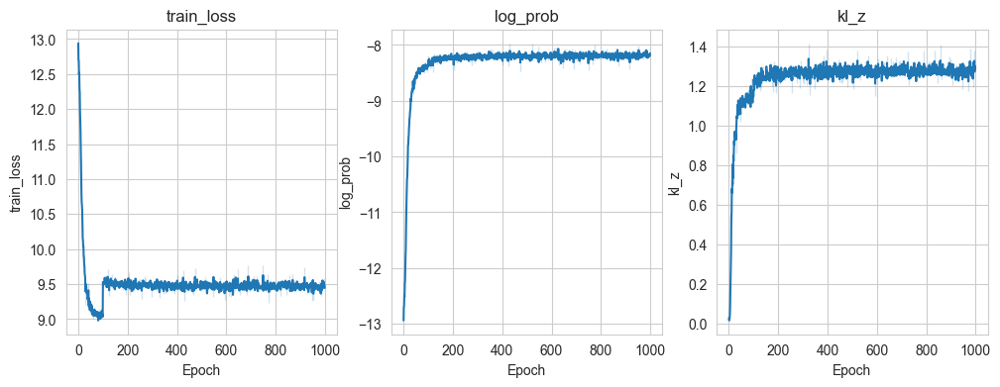

(9.44459056854248, -8.149633407592773, 1.294955849647522)

In [14]:
from decaflow.utils.plot import plot_logs
plot_logs(logger, columns=['train_loss', 'log_prob', 'kl_z'])
logger.values['train_loss'][-1], logger.values['log_prob'][-1], logger.values['kl_z'][-1]

In [15]:
logger_unaware = MyLogger()
trainer_unaware  = L.Trainer(max_epochs=epochs, logger=logger_unaware , enable_checkpointing=False, log_every_n_steps=len(train_loader)-1)
trainer_unaware.fit(unaware_flow, train_loader)

GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
You defined a `validation_step` but have no `val_dataloader`. Skipping val loop.
The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
The lr scheduler dict contains the key(s) ['monitor', 'strict'], but the keys will be ignored. You need to call `lr_scheduler.step()` manually in manual optimization.

  | Name | Type    | Params | Mode 
-----------------------------------------
0 | flow | Decoder | 22.4 K | train
-----------------------------------------
22.4 K    Trainable params
0         Non-trainable params
22.4 K    Total params
0.090     Total estimated model params size (MB)
11        Modules in train mode
0         Modules in eval mode
The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=19` in the `DataLoader` to improve performance

Training: |          | 0/? [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_epochs=1000` reached.


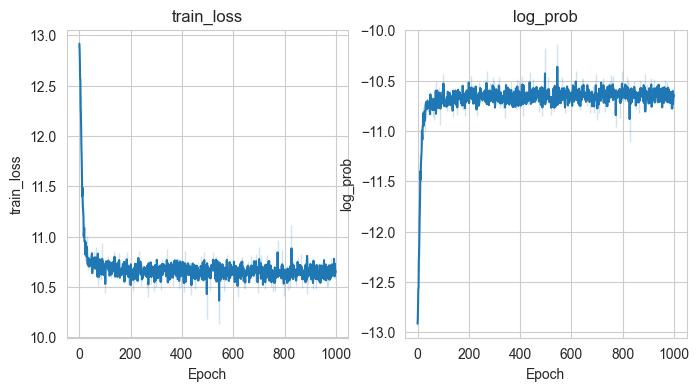

(10.655649185180664, -10.655649185180664)

In [16]:
plot_logs(logger_unaware, columns=['train_loss', 'log_prob'])
logger_unaware.values['train_loss'][-1], logger_unaware.values['log_prob'][-1]

In [17]:
logger_oracle = MyLogger()
trainer_oracle = L.Trainer(max_epochs=epochs, logger=logger_oracle , enable_checkpointing=False, log_every_n_steps=len(train_loader)-1)
trainer_oracle.fit(oracle, all_train_loader)

GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
You defined a `validation_step` but have no `val_dataloader`. Skipping val loop.
The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
The lr scheduler dict contains the key(s) ['monitor', 'strict'], but the keys will be ignored. You need to call `lr_scheduler.step()` manually in manual optimization.

  | Name | Type    | Params | Mode 
-----------------------------------------
0 | flow | Decoder | 25.5 K | train
-----------------------------------------
25.5 K    Trainable params
0         Non-trainable params
25.5 K    Total params
0.102     Total estimated model params size (MB)
11        Modules in train mode
0         Modules in eval mode
The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=19` in the `DataLoader` to improve performance

Training: |          | 0/? [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_epochs=1000` reached.


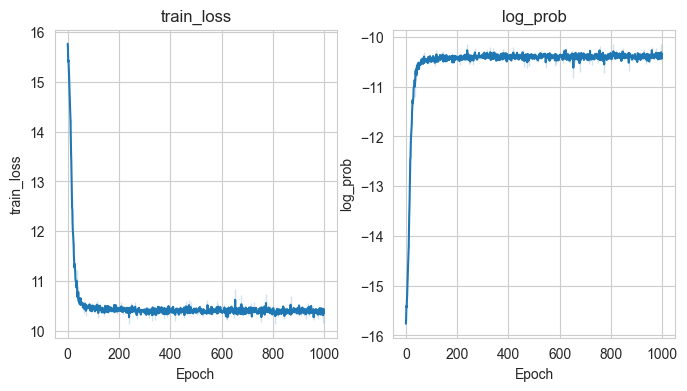

(10.343552589416504, -10.343552589416504)

In [18]:
plot_logs(logger_oracle, columns=['train_loss', 'log_prob'])
logger_oracle.values['train_loss'][-1], logger_oracle.values['log_prob'][-1]

In [19]:
x_gen, z_gen = decaflow.sample((test_size,))
gen_data = torch.cat((z_gen, x_gen), dim=1)
gen_data.shape

torch.Size([2500, 11])

In [20]:
x_gen_unaware, _ = unaware_flow.sample((test_size,))
gen_data_unaware = torch.cat((z_gen,x_gen_unaware), dim=1)

In [21]:
x_gen_oracle, _ = oracle.sample((test_size,))
gen_data_oracle = x_gen_oracle

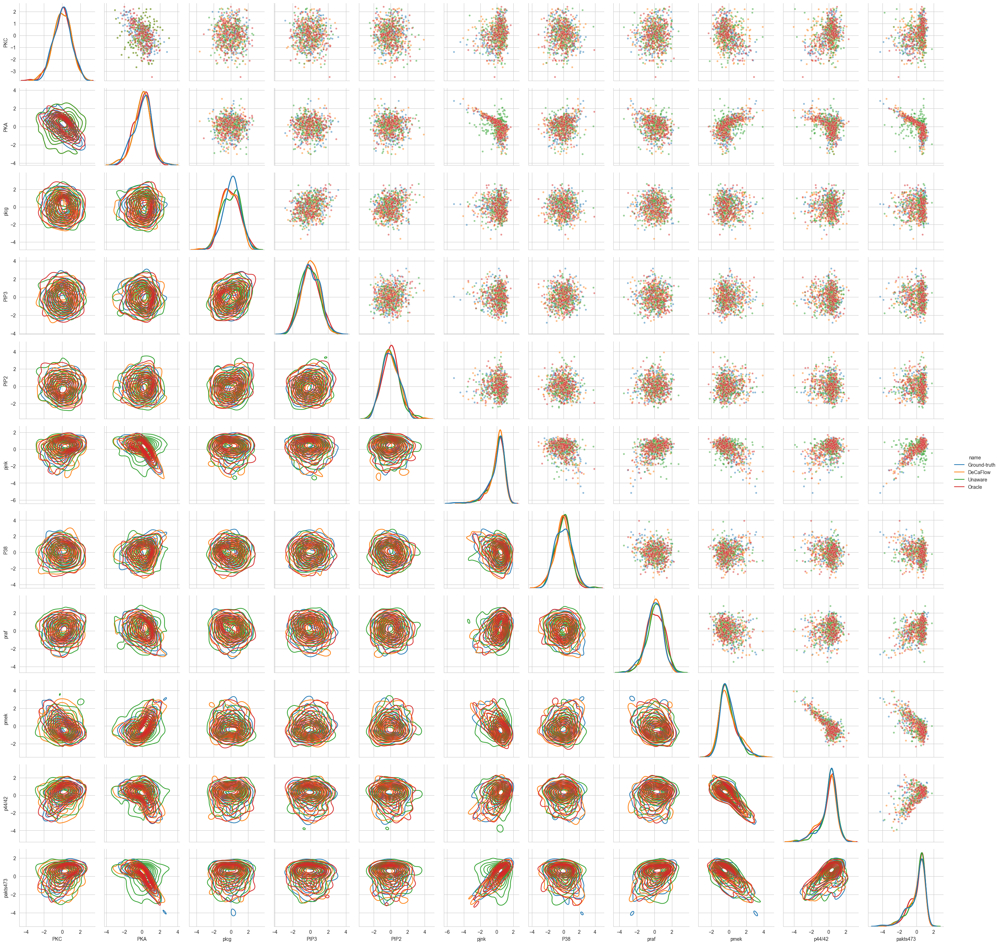

In [22]:
from decaflow.utils.plot import plot_data
num_samples = 200
g = plot_data({'Ground-truth': test_data[:num_samples],
               'DeCaFlow': gen_data[:num_samples],
               'Unaware':gen_data_unaware[:num_samples],
               'Oracle': gen_data_oracle[:num_samples]},
              columns=columns)

In [23]:
torch.quantile(train_data[:, -2], 0.99), torch.quantile(train_data[:, 4], 0.99)

(tensor(1.8852), tensor(2.4696))

In [24]:
index_intervene = 8
value = torch.quantile(train_data[:, index_intervene], 0.1)

true_int_data = generate_int_data(test_size, index_intervene, value * sigma[index_intervene] + mu[index_intervene])
true_int_data = (true_int_data - mu) / sigma

#interventional data with decaflow
x_int, z_int = decaflow.sample_interventional(index_intervene-num_hidden, value, (test_size, ))
int_data = torch.cat((z_int, x_int), dim=1)

#interventional data with unaware flow
x_int_unaware, _ = unaware_flow.sample_interventional(index_intervene-num_hidden, value, (test_size, ))
int_data_unaware = torch.cat((z_int, x_int_unaware), dim=1)

x_int_oracle, _ = oracle.sample_interventional(index_intervene, value, (test_size, ))
int_data_oracle = x_int_oracle

int_data[:, index_intervene] += torch.randn((test_size,)) * 0.01
true_int_data[:,  index_intervene] += torch.randn((test_size,)) * 0.01
int_data_unaware[:, index_intervene] += torch.randn((test_size,)) * 0.01
int_data_oracle[:, index_intervene] += torch.randn((test_size,)) * 0.01


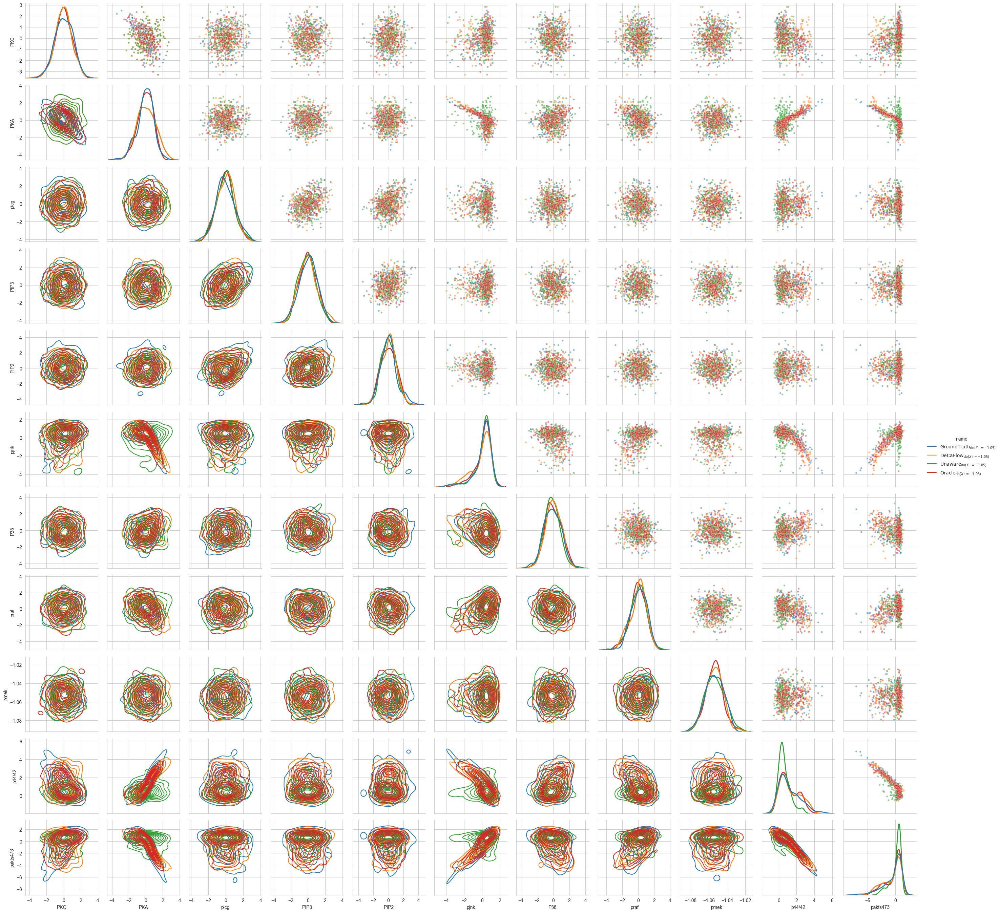

In [25]:
g = plot_data({
    r'$\text{GroundTruth}_{\mathrm{do}(X :=' + f'{float(value):.2f}' + r')}$': true_int_data[:num_samples],
    r'$\text{DeCaFlow}_{\mathrm{do}(X :=' + f'{float(value):.2f}' + r')}$': int_data[:num_samples],
    r'$\text{Unaware}_{\mathrm{do}(X :=' + f'{float(value):.2f}' + r')}$': int_data_unaware[:num_samples],
    r'$\text{Oracle}_{\mathrm{do}(X :=' + f'{float(value):.2f}' + r')}$': int_data_oracle[:num_samples],
}, columns=columns)


In [26]:
J = decaflow.compute_jacobian(x = x_test[:100])
display(J.mean(axis=0))

array([[ 0.9987108 ,  0.        ,  0.        ,  0.        ,  0.        ,
         0.        ,  0.        ,  0.        ,  0.        ],
       [-0.48930007,  1.0534288 ,  0.        ,  0.        ,  0.        ,
         0.        ,  0.        ,  0.        ,  0.        ],
       [-0.48807296, -0.10781825,  1.0671153 ,  0.        ,  0.        ,
         0.        ,  0.        ,  0.        ,  0.        ],
       [ 0.        ,  0.        ,  0.        ,  2.6828148 ,  0.        ,
         0.        ,  0.        ,  0.        ,  0.        ],
       [ 0.        ,  0.        ,  0.        ,  0.        ,  1.1122005 ,
         0.        ,  0.        ,  0.        ,  0.        ],
       [ 0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
         1.1950809 ,  0.        ,  0.        ,  0.        ],
       [ 0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        -0.3080175 ,  1.762484  ,  0.        ,  0.        ],
       [ 0.        ,  0.        ,  0.        ,  0.        ,  0

In [27]:
p_u = torch.distributions.Normal(torch.zeros([100, n_features]), scale=1)
u = p_u.sample()
G = decaflow.compute_jacobian(u = u)
display(G.mean(axis=0))

array([[ 1.0003737 ,  0.        ,  0.        ,  0.        ,  0.        ,
         0.        ,  0.        ,  0.        ,  0.        ],
       [ 0.29549405,  0.9520796 ,  0.        ,  0.        ,  0.        ,
         0.        ,  0.        ,  0.        ,  0.        ],
       [-0.0435185 ,  0.0119031 ,  0.9369654 ,  0.        ,  0.        ,
         0.        ,  0.        ,  0.        ,  0.        ],
       [ 0.        ,  0.        ,  0.        ,  0.34412396,  0.        ,
         0.        ,  0.        ,  0.        ,  0.        ],
       [ 0.        ,  0.        ,  0.        ,  0.        ,  0.9009812 ,
         0.        ,  0.        ,  0.        ,  0.        ],
       [ 0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
         0.81923074,  0.        ,  0.        ,  0.        ],
       [ 0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
         0.22851066,  0.5778507 ,  0.        ,  0.        ],
       [ 0.        ,  0.        ,  0.        ,  0.        ,  0

In [46]:
from decaflow.utils.metrics import get_ate_error, get_counterfactual_error
value_a = torch.quantile(train_data[:, index_intervene], 0.1)
value_b = torch.quantile(train_data[:, index_intervene], 0.9)
index_eval = [9, 10]
ate_error = get_ate_error(flow=decaflow, scm=scm, num_hidden=num_hidden,
                      index_intervene=index_intervene,
                      value_intervene_a=value_a, value_intervene_b=value_b,
                      index_eval=index_eval,
                      scm_scale=sigma, scm_loc=mu)
cf_error = get_counterfactual_error(flow=decaflow, scm=scm, num_hidden=num_hidden,
                                factual = test_data, # z and x
                                index_intervene=index_intervene,
                                value_intervene=value_a,
                                index_eval=index_eval,
                                scm_scale = sigma, scm_loc = mu)
print(f'ATE error: {ate_error:.4f}')
print(f'Counterfactual error: {cf_error:.4f}')

ATE error: 0.1117
Counterfactual error: 0.0491


In [47]:
# Unaware flow metrics
ate_error_unaware = get_ate_error(flow=unaware_flow, scm=scm, num_hidden=num_hidden,
                      index_intervene=index_intervene,
                      value_intervene_a=value_a, value_intervene_b=value_b,
                      index_eval=index_eval,
                      scm_scale = sigma, scm_loc = mu)
cf_error_unaware = get_counterfactual_error(flow=unaware_flow, scm=scm, num_hidden=num_hidden,
                                factual = test_data,  # z and x
                                index_intervene=index_intervene,
                                value_intervene=value_a,
                                index_eval=index_eval,
                                scm_scale = sigma, scm_loc= mu)
print(f'ATE error: {ate_error_unaware:.4f}')
print(f'Counterfactual error: {cf_error_unaware:.4f}')

ATE error: 0.9423
Counterfactual error: 0.3151


TADA! ATE and Counterfactual Error achieved by DeCaFlow are much lower than errors commited by an unaware flow!! :)

In [48]:
green_paths = [('praf', 'pmek'), ('pmek', 'p44/42'), ('p44/42', 'pakts473')]
green_paths_indices = [(node_order.index(t), node_order.index(y)) for t, y in green_paths]

In [49]:
from decaflow.utils.metrics import get_ate_error_multiple_paths, get_counterfactual_error_multiple_paths
df_ate_list = []
df_cf_list = []
decaflow_ate_error_green = get_ate_error_multiple_paths(decaflow, scm,
                                                        quantiles=[0.25, 0.75],
                                                        paths = green_paths_indices,
                                                        hidden_indices=[0,1],
                                                        train_data=train_data,
                                                        scm_scale=sigma,
                                                        scm_loc=mu)
decaflow_cf_error_green = get_counterfactual_error_multiple_paths(decaflow, scm,
                                                                   quantiles = [0.25, 0.75],
                                                                   paths = green_paths_indices,
                                                                   hidden_indices=[0,1],
                                                                   factual=test_data,
                                                                   train_data=train_data,
                                                                   scm_scale=sigma,
                                                                   scm_loc=mu)
decaflow_ate_error_green['model'] = 'decaflow'
decaflow_cf_error_green['model'] = 'decaflow'
df_ate_list.append(decaflow_ate_error_green)
df_cf_list.append(decaflow_cf_error_green)


In [50]:
unaware_ate_error_green = get_ate_error_multiple_paths(unaware_flow, scm,
                                                        quantiles=[0.25, 0.75],
                                                        paths = green_paths_indices,
                                                        hidden_indices=[0,1],
                                                        train_data=train_data,
                                                        scm_scale=sigma,
                                                        scm_loc=mu)
unaware_cf_error_green = get_counterfactual_error_multiple_paths(unaware_flow, scm,
                                                                   quantiles = [0.25, 0.75],
                                                                   paths = green_paths_indices,
                                                                   hidden_indices=[0,1],
                                                                   factual=test_data,
                                                                   train_data=train_data,
                                                                   scm_scale=sigma,
                                                                   scm_loc=mu)
unaware_ate_error_green['model'] = 'unaware'
unaware_cf_error_green['model'] = 'unaware'
df_ate_list.append(unaware_ate_error_green)
df_cf_list.append(unaware_cf_error_green)


In [51]:
oracle_ate_error_green = get_ate_error_multiple_paths(oracle, scm,
                                                        quantiles=[0.25, 0.75],
                                                        paths = green_paths_indices,
                                                        hidden_indices=None,
                                                        train_data=train_data,
                                                        scm_scale=sigma,
                                                        scm_loc=mu)
oracle_cf_error_green = get_counterfactual_error_multiple_paths(oracle, scm,
                                                                   quantiles = [0.25, 0.75],
                                                                   paths = green_paths_indices,
                                                                   hidden_indices=None,
                                                                   factual=test_data,
                                                                   train_data=train_data,
                                                                   scm_scale=sigma,
                                                                   scm_loc=mu)
oracle_ate_error_green['model'] = 'oracle'
oracle_cf_error_green['model'] = 'oracle'
df_ate_list.append(oracle_ate_error_green)
df_cf_list.append(oracle_cf_error_green)


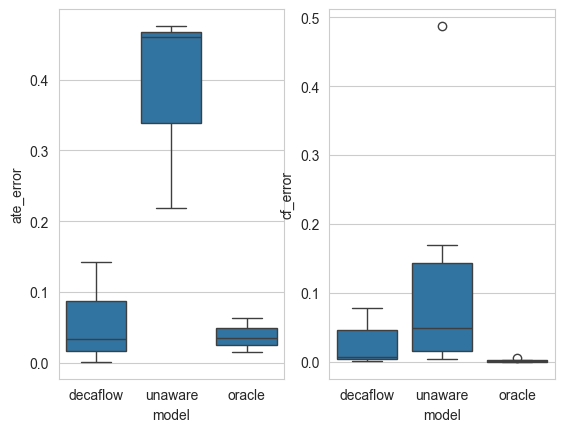

In [52]:
df_ate = pd.concat(df_ate_list, ignore_index=True)
df_cf = pd.concat(df_cf_list, ignore_index=True)

df_ate_melt = pd.melt(df_ate, id_vars='model', var_name='intervention', value_name='ate_error')
df_cf_melt = pd.melt(df_cf, id_vars='model', var_name='intervention', value_name='cf_error')

fig, axs = plt.subplots(1, 2)
ate_plot = sns.boxplot(x='model', y='ate_error', data=df_ate_melt, ax=axs[0])
cf_plot = sns.boxplot(x='model', y='cf_error', data=df_cf_melt, ax=axs[1])

plt.show()
